In [1]:
import numpy as np
import cort
import cort.manip
import cort.display
import json
import torch

import matplotlib.pyplot as plt
import evaluate
import experiments
import datasets
import nnet.training

%load_ext autoreload
%autoreload 2

In [2]:

EXP_NAME = "fin_comb"

all_results = datasets.datatypes.PatchDataItems.load(f"experiments/results/{EXP_NAME}/test")
siibra_results = datasets.datatypes.PatchDataItems.load(f"experiments/results/{EXP_NAME}/siibra_test")
#train_log = json.load(open(f"experiments/results/{EXP_NAME}/logs/train_losses.json"))
#val_log = json.load(open(f"experiments/results/{EXP_NAME}/logs/val_losses.json"))
#train_acc = json.load(open(f"experiments/results/{EXP_NAME}/logs/train_accs.json"))
#val_acc = json.load(open(f"experiments/results/{EXP_NAME}/logs/val_accs.json"))

#denoise_train_log = json.load(open(f"experiments/results/denoise/logs/train_losses.json"))
#denoise_val_log = json.load(open(f"experiments/results/denoise/logs/val_losses.json"))
#denoise_train_acc = json.load(open(f"experiments/results/denoise/logs/train_accs.json"))
#denoise_val_acc = json.load(open(f"experiments/results/denoise/logs/val_accs.json"))

#train_log = nnet.training.Log.load(f"experiments/results/{EXP_NAME}/train_log_0.json")

print(f"Loaded {len(all_results)} results")

Loaded 94 results


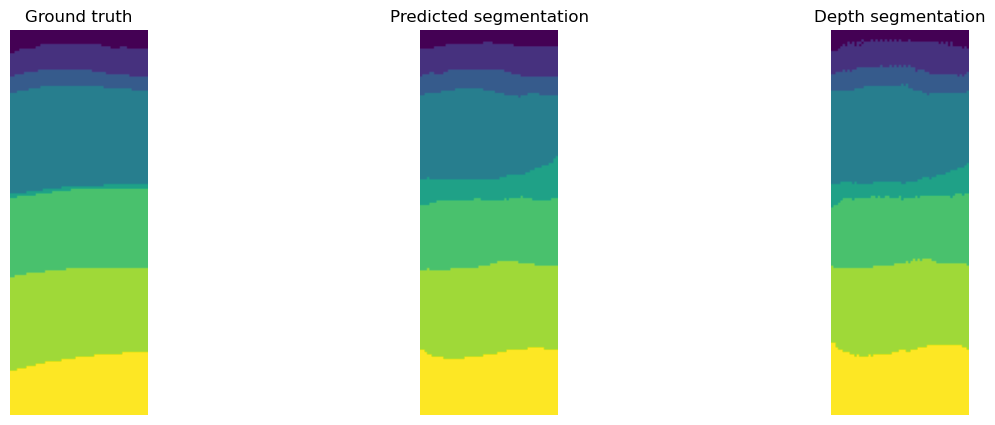

In [6]:
random_patch = all_results.sample(1)[0]

gt_seg = random_patch.gt_segmentation
pred_seg = random_patch.pred_segmentation
depth_maps = random_patch.pred_depth_map

depth_seg = np.ceil(depth_maps).sum(axis=0)

fig, ax = plt.subplots(1, 3, figsize=(15, 5))

ax[0].imshow(gt_seg)
ax[0].set_title("Ground truth")
ax[0].axis("off")

ax[1].imshow(pred_seg)
ax[1].set_title("Predicted segmentation")
ax[1].axis("off")

ax[2].imshow(depth_seg)
ax[2].set_title("Depth segmentation")
ax[2].axis("off")

plt.show()

In [11]:
macro_f1 = experiments.calc_macro_f1(all_results)
macro_f1_denoised = experiments.calc_macro_f1(all_results, denoised=True)

print(f"Macro F1 score: {macro_f1:.1%}")
print(f"Denoised macro F1 score: {macro_f1_denoised:.1%}")

#no_corners = all_results.filter(lambda x: not x.is_corner_patch)

#macro_f1_no_corners = experiments.calc_macro_f1(no_corners)
#macro_f1_denoised_no_corners = experiments.calc_macro_f1(no_corners, denoised=True)

#print(f"Macro F1 score (no corners): {macro_f1_no_corners:.1%}")
#print(f"Denoised macro F1 score (no corners): {macro_f1_denoised_no_corners:.1%}")

#corners = all_results.filter(lambda x: x.is_corner_patch)

#macro_f1_corners = experiments.calc_macro_f1(corners)
#macro_f1_denoised_corners = experiments.calc_macro_f1(corners, denoised=True)

#print(f"Macro F1 score (corners): {macro_f1_corners:.1%}")
#print(f"Denoised macro F1 score (corners): {macro_f1_denoised_corners:.1%}")

Macro F1 score: 79.2%
Denoised macro F1 score: 78.8%


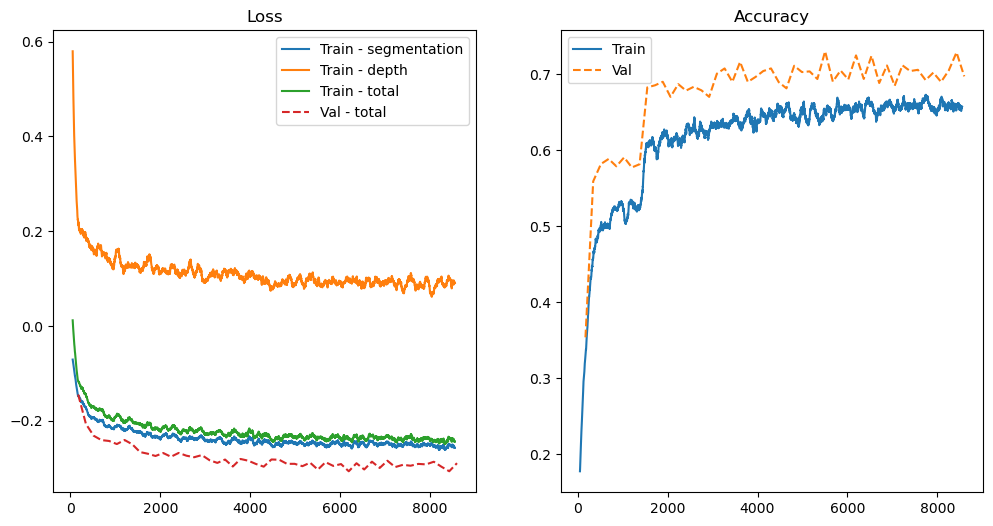

In [4]:
train_log.plot(smoothing=100)

NameError: name 'val_log' is not defined

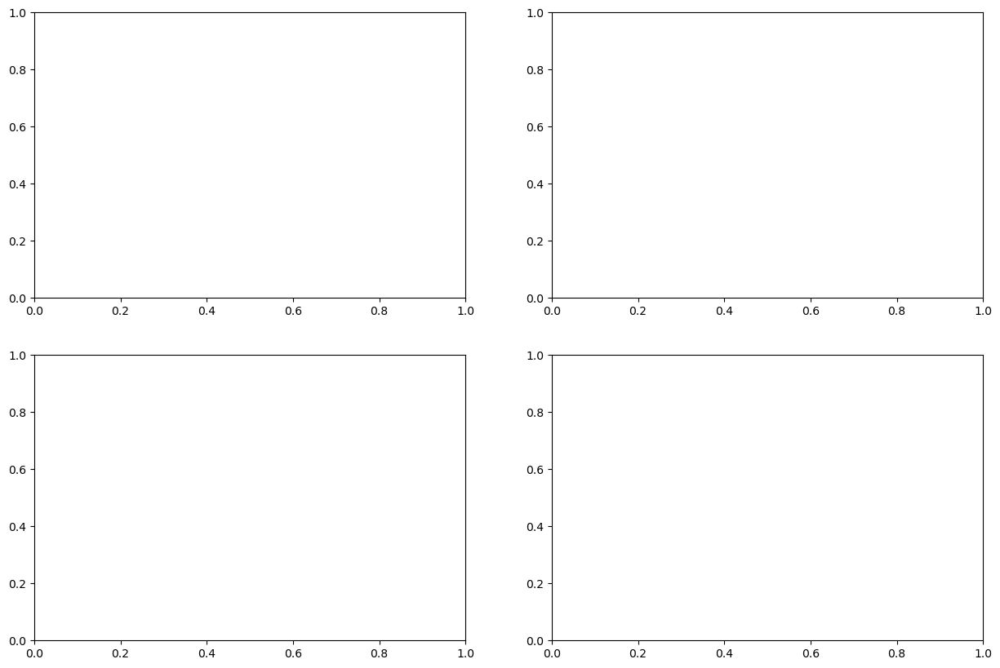

In [9]:
def get_plotable_log(train_log, val_log):
    train_avg_loss = [np.mean(list(train_log.values())[i:i+50]) for i in range(0, len(train_log), 50)]
    train_steps = [int(key) for key in train_log.keys()]
    train_avg_step = [np.mean(train_steps[i:i+50]) for i in range(0, len(train_log), 50)]
    val_steps = [int(key) for key in val_log.keys()]
    val_loss = list(val_log.values())
    return train_avg_step, train_avg_loss, val_steps, val_loss

fig, ax = plt.subplots(2, 2, figsize=(15, 10))

for i, (train, val) in enumerate([(train_log, val_log), (train_acc, val_acc), (denoise_train_log, denoise_val_log), (denoise_train_acc, denoise_val_acc)]):
    train_step, train_loss, val_step, val_loss = get_plotable_log(train, val)
    ax[i//2,i%2].plot(train_step, train_loss, label="Training")
    ax[i//2,i%2].plot(val_step, val_loss, label="Validation")
    ax[i//2,i%2].legend()
    plot_type = "Denoised" if i > 1 else "Segmentation" 
    acc_loss = "CombinedLoss" if i%2 == 0 else "Accuracy"
    ax[i//2,i%2].set_title(f"{plot_type} {acc_loss}")
    ax[i//2,i%2].set_xlabel("Step")
    ax[i//2,i%2].set_ylabel(acc_loss)
plt.show()


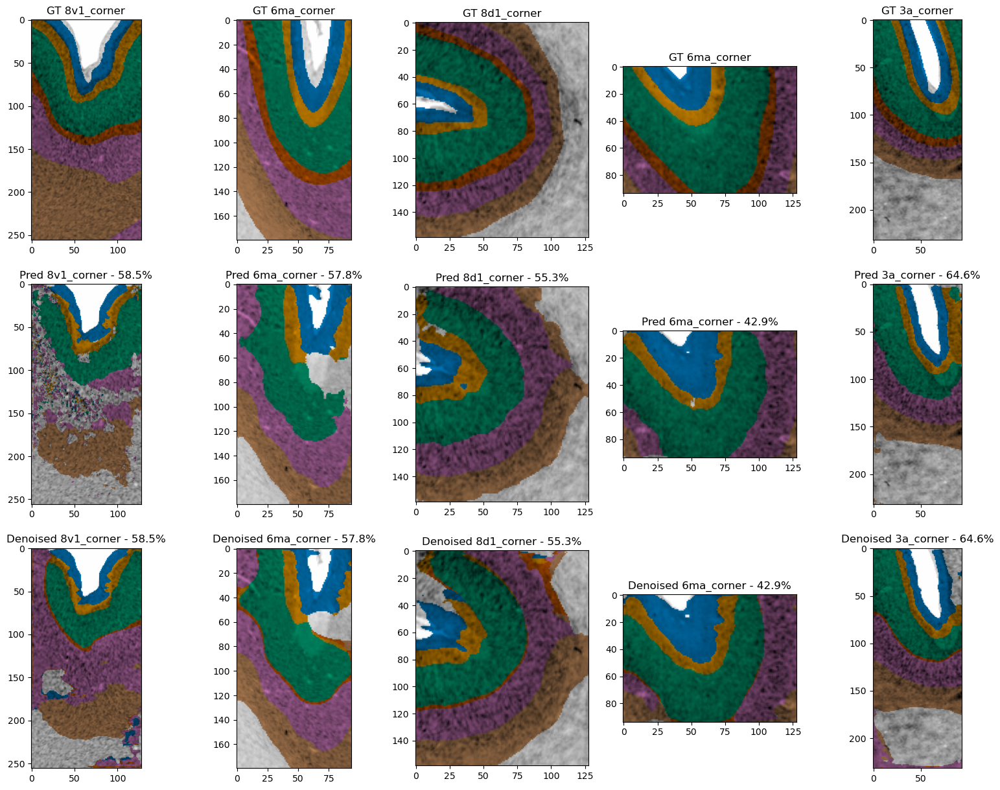

In [13]:
corners = [result for result in all_results if result.is_corner_patch]
fig, ax = plt.subplots(3, 5, figsize=(20, 15))

for i, corner in enumerate(corners[:5]):
    img = cort.display.colour_patch(corner.input_image, corner.gt_segmentation)
    ax[0,i].imshow(img)
    ax[0,i].set_title(f"GT {corner.brain_area}")
    img = cort.display.colour_patch(corner.input_image, corner.pred_segmentation)
    ax[1,i].imshow(img)
    ax[1,i].set_title(f"Pred {corner.brain_area} - {corner.prediction.accuracy:.1%}")
    img = cort.display.colour_patch(corner.input_image, corner.pred_denoised_segmentation)
    ax[2,i].imshow(img)
    ax[2,i].set_title(f"Denoised {corner.brain_area} - {corner.prediction.accuracy:.1%}")
plt.show()

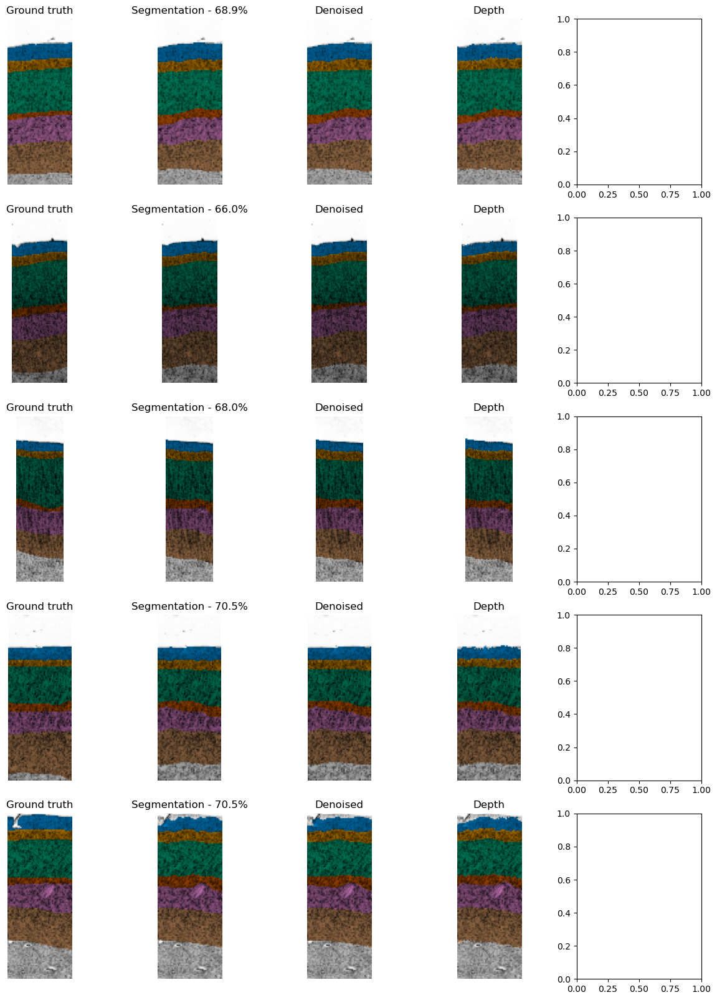

In [13]:
sample_results = all_results.sample(5)

fig, ax = plt.subplots(5, 5, figsize=(15, 20))

for i, rand_result in enumerate(sample_results):
    gt_img = cort.display.colour_patch(rand_result.input_image, rand_result.gt_segmentation)
    pred_img = cort.display.colour_patch(rand_result.input_image, rand_result.pred_segmentation)
    denoised_img = cort.display.colour_patch(rand_result.input_image, rand_result.pred_denoised_segmentation)
    depth_img = cort.display.colour_patch(
        rand_result.input_image,
        cort.display.draw_depth_seg(rand_result.pred_depth_map)
    )
                                          
    autoencoded_img = rand_result.autoencoded_img
   
    ax[i,0].imshow(gt_img)
    ax[i,0].set_title("Ground truth")
    ax[i,0].axis("off")
    
    ax[i,1].imshow(pred_img)
    ax[i,1].set_title(f"Segmentation - {rand_result.prediction.accuracy:.1%}")
    ax[i,1].axis("off")
    
    ax[i,2].imshow(denoised_img)
    ax[i,2].set_title("Denoised")
    ax[i,2].axis("off")
    
    ax[i,3].imshow(depth_img, cmap="rainbow")
    ax[i,3].set_title("Depth")
    ax[i,3].axis("off")
    
    #ax[i,4].imshow(autoencoded_img, cmap="gray")
    #ax[i,4].set_title("Autoencoded")
    #ax[i,4].axis("off")
    

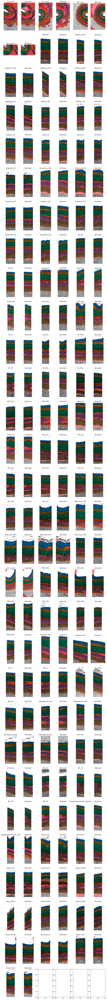

In [14]:
cols = 3
fig, ax = plt.subplots(int(np.ceil(len(all_results.brain_areas)/cols)), cols*2, figsize=(15,5*len(all_results.brain_areas)//cols))
for i, area in enumerate(sorted(all_results.brain_areas, key=lambda x: x.lower())):
    rand_result = all_results.get_brain_area_example(brain_area=area)
    evaluate.display_patch_diff_alt(rand_result.input_image, rand_result.gt_segmentation, rand_result.pred_segmentation, ax=ax[i//cols, (i%cols)*2])
    ax[i//cols, (i%cols)*2].set_title(area)
    evaluate.display_patch_diff_alt(rand_result.input_image, rand_result.gt_segmentation, rand_result.pred_denoised_segmentation, ax=ax[i//cols, (i%cols)*2+1])
    ax[i//cols, (i%cols)*2+1].set_title("Denoised")
plt.show()

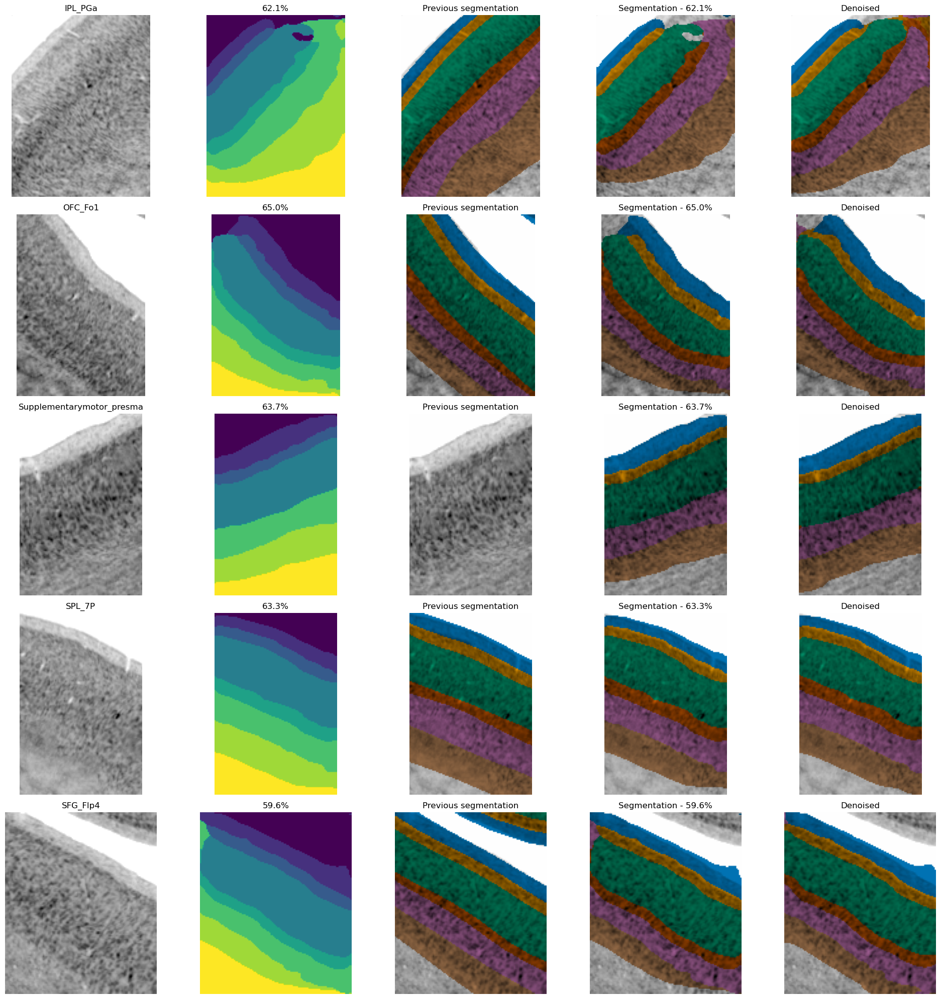

In [52]:
fig, ax = plt.subplots(5, 5, figsize=(20, 20))
for i, rand_result in enumerate(siibra_results.sample(5)):
    img = cort.display.colour_patch(rand_result.input_image, rand_result.pred_segmentation)
    img_de = cort.display.colour_patch(rand_result.input_image, rand_result.pred_denoised_segmentation)
    prev_seg = cort.display.colour_patch(rand_result.input_image, rand_result.existing_cort_layers)
    ax[i,0].imshow(rand_result.input_image, cmap="gray")
    ax[i,0].set_title(f"{rand_result.brain_area}")
    ax[i,0].axis("off")
    ax[i,1].imshow(rand_result.pred_segmentation)
    ax[i,1].set_title(f"{rand_result.prediction.accuracy:.1%}")
    ax[i,1].axis("off")
    ax[i,2].imshow(prev_seg)
    ax[i,2].set_title("Previous segmentation")
    ax[i,2].axis("off")
    ax[i,3].imshow(img)
    ax[i,3].set_title(f"Segmentation - {rand_result.prediction.accuracy:.1%}")
    ax[i,3].axis("off")
    ax[i,4].imshow(img_de)
    ax[i,4].set_title(f"Denoised")
    ax[i,4].axis("off")
    #print(rand_result.acc_pred)

plt.tight_layout()
plt.show()

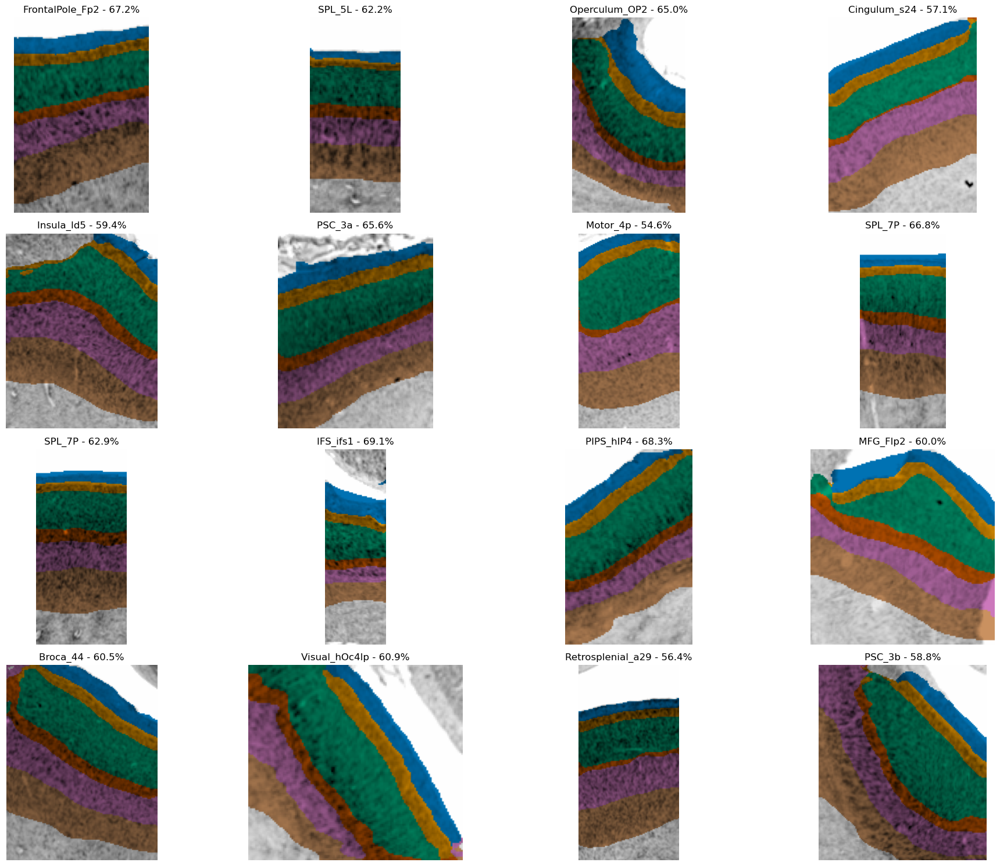

In [53]:
fig, ax = plt.subplots(4, 4, figsize=(20, 15))
for i, rand_result in enumerate(siibra_results.sample(16)):
    img = cort.display.colour_patch(rand_result.input_image, rand_result.pred_denoised_segmentation)
    ax[i//4,i%4].imshow(img)
    ax[i//4,i%4].set_title(f"{rand_result.brain_area} - {rand_result.prediction.accuracy:.1%}")
    ax[i//4,i%4].axis("off")
    #print(rand_result.acc_pred)

plt.tight_layout()
plt.show()

188
Correlation coefficient: 0.60


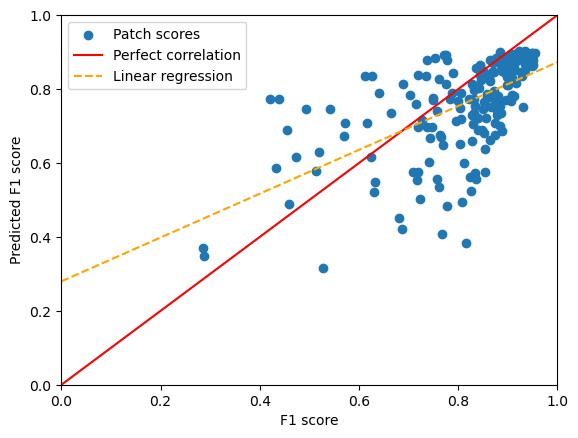

In [3]:
x = []
y = []

for result in siibra_results:
    f1_score = evaluate.f1_score(result.prediction.segmentation, result.ground_truth.segmentation, n_classes=8, ignore_index=cort.constants.PADDING_MASK_VALUE)
    pred_score = result.prediction.accuracy
    if not np.isnan(f1_score):
        x.append(f1_score)
        y.append(pred_score)
for result in all_results:
    f1_score = evaluate.f1_score(result.prediction.segmentation, result.ground_truth.segmentation, n_classes=8, ignore_index=cort.constants.PADDING_MASK_VALUE)
    pred_score = result.prediction.accuracy
    if not np.isnan(f1_score):
        x.append(f1_score)
        y.append(pred_score)

print(len(x))

r = np.corrcoef(x, y)[0,1]
print(f"Correlation coefficient: {r:.2f}")

line = np.polyfit(x, y, 1)

plt.scatter(x, y)
plt.plot([0, 1], [0, 1], color="red")
plt.plot([0, 1], [line[1], line[0] + line[1]], color="orange", linestyle="--")
plt.xlabel("F1 score")
plt.ylabel("Predicted F1 score")
plt.legend(["Patch scores", "Perfect correlation", "Linear regression"])
plt.xlim(0, 1)
plt.ylim(0, 1)
plt.show()

In [4]:
result_accs = [
    (result, evaluate.f1_score(result.prediction.segmentation, result.ground_truth.segmentation, n_classes=8, ignore_index=cort.constants.PADDING_MASK_VALUE))
    for result in all_results
]
result_accs.sort(key=lambda x: x[1])

result_accs_denoised = [
    (result, evaluate.f1_score(result.prediction.denoised_segmentation, result.ground_truth.segmentation, n_classes=8, ignore_index=cort.constants.PADDING_MASK_VALUE))
    for result in all_results
]
result_accs_denoised.sort(key=lambda x: x[1])

result_accs_corner = [
    (result, acc) for result, acc in result_accs if result.is_corner_patch
]

result_accs_no_corner = [
    (result, acc) for result, acc in result_accs if not result.is_corner_patch
]

95.57793140411377
95.90442180633545


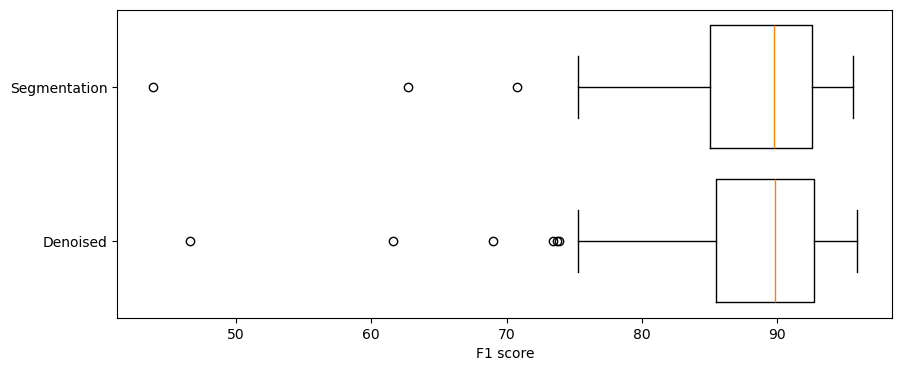

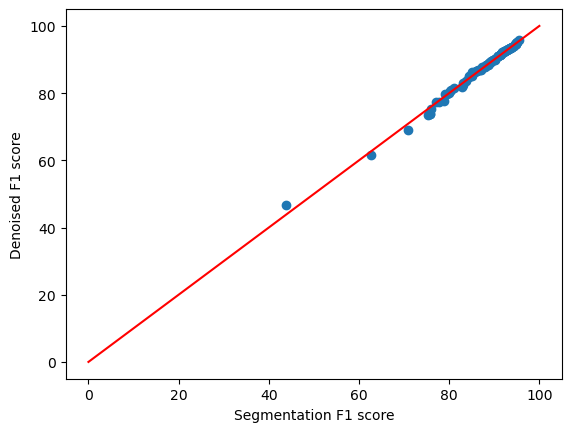

In [5]:
acc_val = np.array([result_acc[1] for result_acc in result_accs])*100
de_acc_val = np.array([result_acc[1] for result_acc in result_accs_denoised])*100

print(acc_val[-1])
print(de_acc_val[-1])

plt.figure(figsize=(10, 4))
plt.boxplot([de_acc_val,acc_val], labels=["Denoised","Segmentation"], vert=False, widths=0.8)
plt.xlabel("F1 score")
plt.show()

plt.scatter(acc_val, de_acc_val)
plt.plot([0, 100], [0, 100], color="red")

plt.xlabel("Segmentation F1 score")
plt.ylabel("Denoised F1 score")
plt.show()

In [7]:
high_acc_result = result_accs_no_corner[-1][0]
low_acc_result = result_accs_no_corner[0][0]
mid_acc_result = result_accs_no_corner[len(result_accs)//2][0]
corner_result = result_accs_corner[-2][0]

labelled_results = [
    ("High accuracy", high_acc_result),
    ("Mid accuracy", mid_acc_result),
    ("Low accuracy", low_acc_result),
    ("High curvature", corner_result)
]

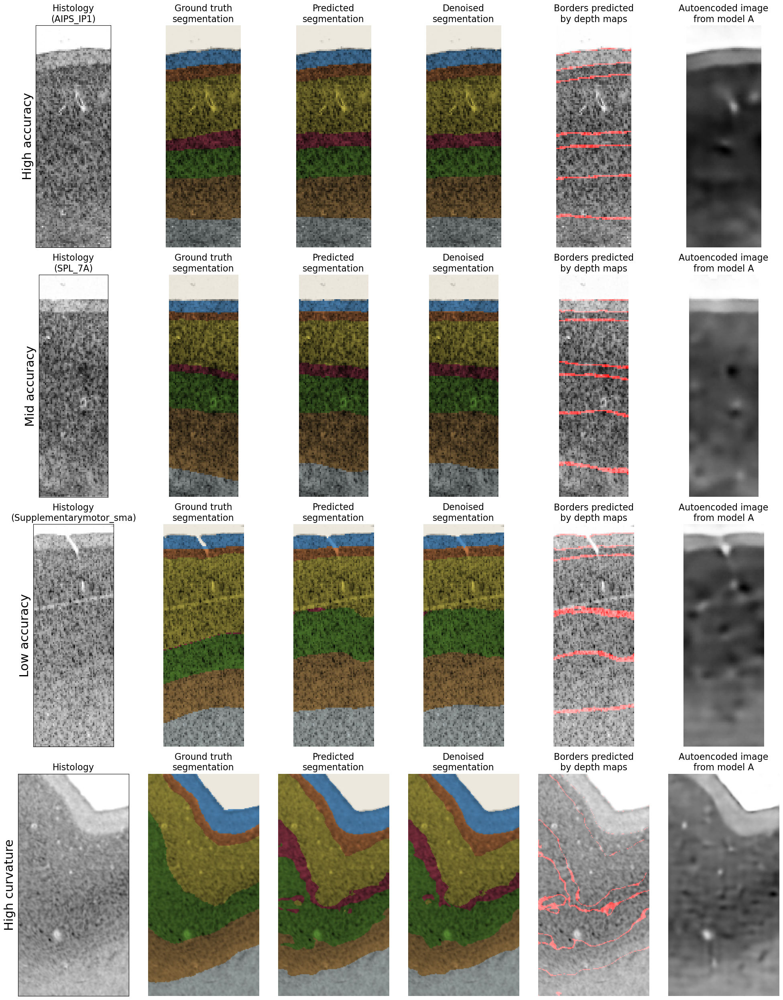

In [12]:
fig, axes = plt.subplots(4, 6, figsize=(20, 25))

rows = [name for name, _ in labelled_results]

for i, (result_name, result) in enumerate(labelled_results):
    hist = result.input_image
    gt = cort.display.colour_patch(result.input_image, result.gt_segmentation)
    pred = cort.display.colour_patch(result.input_image, result.pred_segmentation)
    denoised = cort.display.colour_patch(result.input_image, result.pred_denoised_segmentation)
    depth = cort.display.draw_depth_lines(result.pred_depth_map, result.input_image)
    autoencoded_img = result.autoencoded_img
    brain_area = result.brain_area
    
    axes[i,0].imshow(hist, cmap="gray")
    axes[i,0].set_title(f"Histology\n({brain_area})" if "corner" not in brain_area else "Histology", size=16)
    
    axes[i,0].tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False, labelbottom=False, labelleft=False)
    
    axes[i,1].imshow(gt)
    axes[i,1].set_title("Ground truth\nsegmentation", size=16)
    axes[i,1].axis("off")

    axes[i,2].imshow(pred)
    axes[i,2].set_title("Predicted\nsegmentation", size=16)
    axes[i,2].axis("off")
    
    axes[i,3].imshow(denoised)
    axes[i,3].set_title("Denoised\nsegmentation", size=16)
    axes[i,3].axis("off")
    
    axes[i,4].imshow(depth)
    axes[i,4].set_title("Borders predicted\nby depth maps", size=16)
    axes[i,4].axis("off")
    
    axes[i,5].imshow(autoencoded_img, cmap="gray")
    axes[i,5].set_title("Autoencoded image\nfrom model A", size=16)
    axes[i,5].axis("off")
    
for ax, row in zip(axes[:,0], rows):
    ax.set_ylabel(row, rotation=90, size=22)
    
plt.tight_layout()

plt.show()
 

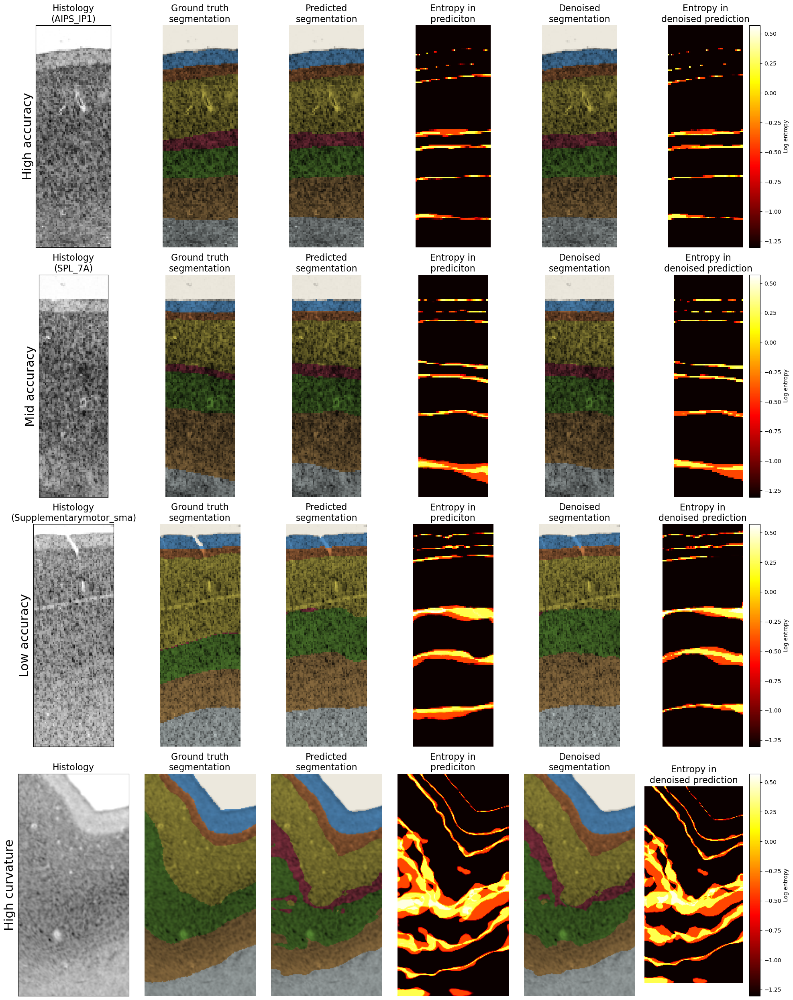

In [11]:
fig, axes = plt.subplots(4, 6, figsize=(20, 25))

rows = [name for name, _ in labelled_results]

entropies = [np.log(evaluate.calculate_entropy(cort.manip.unpad_img(rand_result.prediction.logits, rand_result.ground_truth.segmentation)) + 1e-6) for _, rand_result in labelled_results]

denoised_entropies = [np.log(evaluate.calculate_entropy(cort.manip.unpad_img(rand_result.prediction.denoised_logits, rand_result.ground_truth.segmentation)) + 1e-6) for _, rand_result in labelled_results]

entropy_max = max([entropy.max() for entropy in entropies] + [denoised_entropy.max() for denoised_entropy in denoised_entropies])
entropy_min = min([entropy.min() for entropy in entropies] + [denoised_entropy.min() for denoised_entropy in denoised_entropies])

for i, ((result_name, result), entropy, denoised_entropy) in enumerate(zip(labelled_results, entropies, denoised_entropies)):
    hist = result.input_image
    gt = cort.display.colour_patch(result.input_image, result.gt_segmentation)
    pred = cort.display.colour_patch(result.input_image, result.pred_segmentation)
    denoised = cort.display.colour_patch(result.input_image, result.pred_denoised_segmentation)
    brain_area = result.brain_area
    
    
    unpad_mask = (result.ground_truth.segmentation != cort.constants.PADDING_MASK_VALUE)
    
    axes[i,0].imshow(hist, cmap="gray")
    axes[i,0].set_title(f"Histology\n({brain_area})" if "corner" not in brain_area else "Histology", size=16)
    #disable ticks
    axes[i,0].tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False, labelbottom=False, labelleft=False)
    
    axes[i,1].imshow(gt)
    axes[i,1].set_title("Ground truth\nsegmentation", size=16)
    axes[i,1].axis("off")

    axes[i,2].imshow(pred)
    axes[i,2].set_title("Predicted\nsegmentation", size=16)
    axes[i,2].axis("off")
    
    axes[i,4].imshow(denoised)
    axes[i,4].set_title("Denoised\nsegmentation", size=16)
    axes[i,4].axis("off")
    
    axes[i,3].imshow(entropy, cmap="hot", vmin=entropy_min, vmax=entropy_max)
    axes[i,3].set_title("Entropy in\nprediciton", size=16)
    axes[i,3].axis("off")
    
    axes[i,5].imshow(denoised_entropy, cmap="hot", vmin=entropy_min, vmax=entropy_max)
    axes[i,5].set_title("Entropy in\ndenoised prediction", size=16)
    axes[i,5].axis("off")
    
    # add colorbar
    #cbar = plt.colorbar(axes[i,3].imshow(entropy, cmap="hot", vmin=entropy_min, vmax=entropy_max), ax=axes[i,3])
    #cbar.set_label("Entropy")
    
    cbar = plt.colorbar(axes[i,5].imshow(denoised_entropy, cmap="hot", vmin=entropy_min, vmax=entropy_max), ax=axes[i,5])
    cbar.set_label("Log entropy")
    
    
for ax, row in zip(axes[:,0], rows):
    ax.set_ylabel(row, rotation=90, size=22)
    
plt.tight_layout()

plt.show()
 

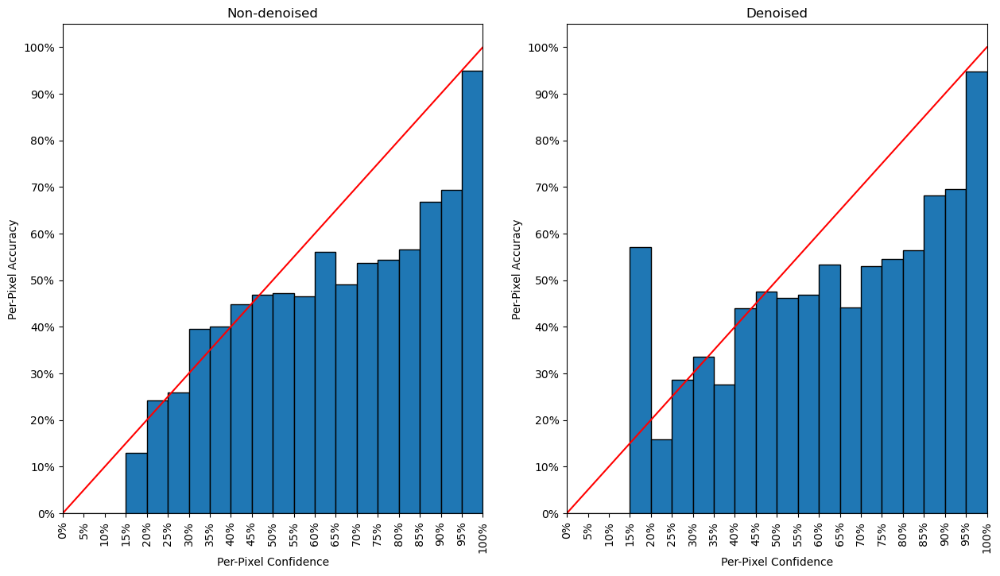

In [9]:

def get_confidence(results, n_bins, denoised=False):
    img_conf = None
    img_correct = None


    for result in results:
        unpad_mask = (result.ground_truth.segmentation != cort.constants.PADDING_MASK_VALUE)
        if denoised:
            cur_conf = result.prediction.denoised_logits[:,unpad_mask.squeeze()].softmax(dim=0).max(dim=0).values
        else:
            cur_conf = result.prediction.logits[:,unpad_mask.squeeze()].softmax(dim=0).max(dim=0).values
        cur_correct = result.prediction.segmentation[unpad_mask] == result.ground_truth.segmentation[unpad_mask]
        
        if img_conf is None:
            img_conf = cur_conf
            img_correct = cur_correct
        else:
            img_conf = torch.cat((img_conf, cur_conf))
            img_correct = torch.cat((img_correct, cur_correct))


    conf_align = np.zeros(n_bins)
    
    for i in range(n_bins):
        cur_correct = img_correct[(img_conf > i/n_bins) & (img_conf <= (i+1)/n_bins)]
        conf_align[i] = cur_correct.float().mean()
        if np.isnan(conf_align[i]):
            conf_align[i] = 0
            
    return conf_align

n_bins = 20
    
conf_align = get_confidence(all_results, n_bins)
conf_align_denoised = get_confidence(all_results, n_bins, denoised=True)

fig, ax = plt.subplots(1, 2, figsize=(15, 8))

def plot_align_on_ax(ax, conf_align, title):
    ax.bar(range(n_bins), conf_align, align="edge", width=1, edgecolor="black")
    ax.set_xlim(0, n_bins)
    ax.set_xticks(range(n_bins+1))
    ax.set_xticklabels([f"{i/n_bins:.0%}" for i in range(n_bins+1)], rotation=90)
    ax.set_ylabel("Per-Pixel Accuracy")
    ax.set_xlabel("Per-Pixel Confidence")
    ax.set_yticks(np.linspace(0, 1, 11))
    ax.set_yticklabels([f"{i:.0%}" for i in np.linspace(0, 1, 11)])
    ax.plot([0, n_bins], [0, 1], color="red")
    ax.set_title(title)

plot_align_on_ax(ax[0], conf_align, "Non-denoised")
plot_align_on_ax(ax[1], conf_align_denoised, "Denoised")

plt.show()
    

In [27]:
test_result = all_results[5]

unpad_mask = (test_result.ground_truth.segmentation != cort.constants.PADDING_MASK_VALUE)

test_logits = test_result.prediction.logits[:,unpad_mask.squeeze()]
test_gt_seg = test_result.ground_truth.segmentation[unpad_mask]

confidences = test_logits.softmax(dim=0)
accuracy = torch.nn.functional.one_hot(test_gt_seg, num_classes=8).float().T

print(confidences.shape)
print(accuracy.shape)

torch.Size([8, 7990])
torch.Size([8, 7990])


In [10]:
## SCE - Segmentation Confidence Entropy

def calc_sce(results, n_bins, denoised=False):
    confs = []
    accs = []
    
    for result in results:
        unpad_mask = (result.ground_truth.segmentation != cort.constants.PADDING_MASK_VALUE)
    
        test_logits = result.prediction.logits[:,unpad_mask.squeeze()] if not denoised else result.prediction.denoised_logits[:,unpad_mask.squeeze()]
        test_gt_seg = result.ground_truth.segmentation[unpad_mask]
        
        confidences = test_logits.softmax(dim=0)
        accuracy = torch.nn.functional.one_hot(test_gt_seg, num_classes=8).float().T
        
        confs.append(confidences)
        accs.append(accuracy)
        
    confs = torch.cat(confs, dim=1)
    accs = torch.cat(accs, dim=1)
    
    ordered_confs = [(confs[:,i].numpy(), accs[:,i].numpy(), confs[:,i].max().item()) for i in range(confs.shape[1])]
    ordered_confs.sort(key=lambda x: x[2])
    
    bin_size = np.ceil(len(ordered_confs)/n_bins)
    
    bins = []
    for i in range(n_bins):
        bin_start = int(i*bin_size)
        bin_end = int((i+1)*bin_size)
        
        bin_confs = np.array([conf for conf, _, _ in ordered_confs[bin_start:bin_end]])
        bin_accs = np.array([acc for _, acc, _ in ordered_confs[bin_start:bin_end]])
        
        bins.append((bin_confs, bin_accs))
    
    sce = np.zeros(n_bins)
    
    for i, (bin_confs, bin_accs) in enumerate(bins):
        sce[i] = np.mean(len(bin_confs)/len(ordered_confs) * np.sum(np.abs(np.mean(bin_accs, axis=0) - np.mean(bin_confs, axis=0))))
        
    sce = np.sum(sce)
    
    return sce
    
all_sce = calc_sce(all_results, 20)

print(all_sce)

0.08137557664886118


In [11]:
all_sce_denoised = calc_sce(all_results, 10, denoised=True)

print(all_sce_denoised)

0.08370094224810601


Max entropy: tensor(0.4423)
Min entropy: tensor(-16.8876)


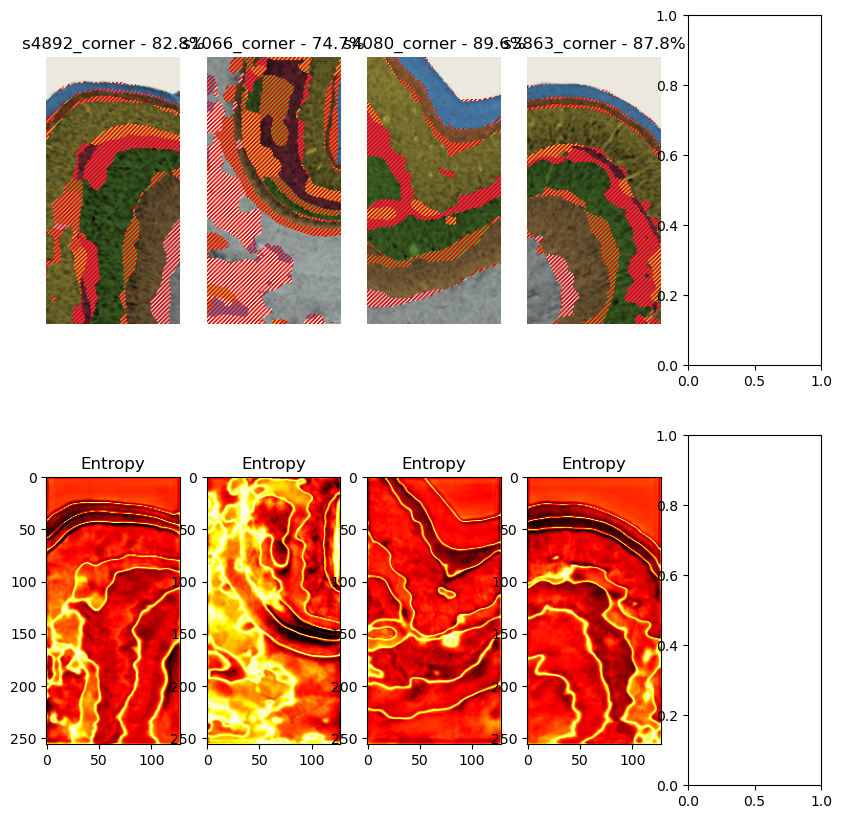

In [19]:
fig, ax = plt.subplots(2,5, figsize=(10, 10))

rand_results = all_results.sample(50)
rand_results = [result for result in all_results if result.is_corner_patch]

entropies = [np.log(evaluate.calculate_entropy(cort.manip.unpad_img(rand_result.prediction.logits, rand_result.ground_truth.segmentation)) + 1e-6) for rand_result in rand_results]

entropy_max = max([entropy.max() for entropy in entropies])
entropy_min = min([entropy.min() for entropy in entropies])

print("Max entropy:", entropy_max)
print("Min entropy:", entropy_min)

for i, (entropy, rand_result) in enumerate(list(zip(entropies, rand_results))[:5]):
    
    evaluate.display_patch_diff_alt(rand_result.input_image, rand_result.gt_segmentation, rand_result.pred_segmentation, ax=ax[0,i])
    ax[0,i].set_title(f"{rand_result.brain_area} - {rand_result.prediction.accuracy:.1%}")
    
    ax[1,i].imshow(entropy, cmap="hot", vmin=entropy_min, vmax=entropy_max)
    ax[1,i].set_title(f"Entropy")


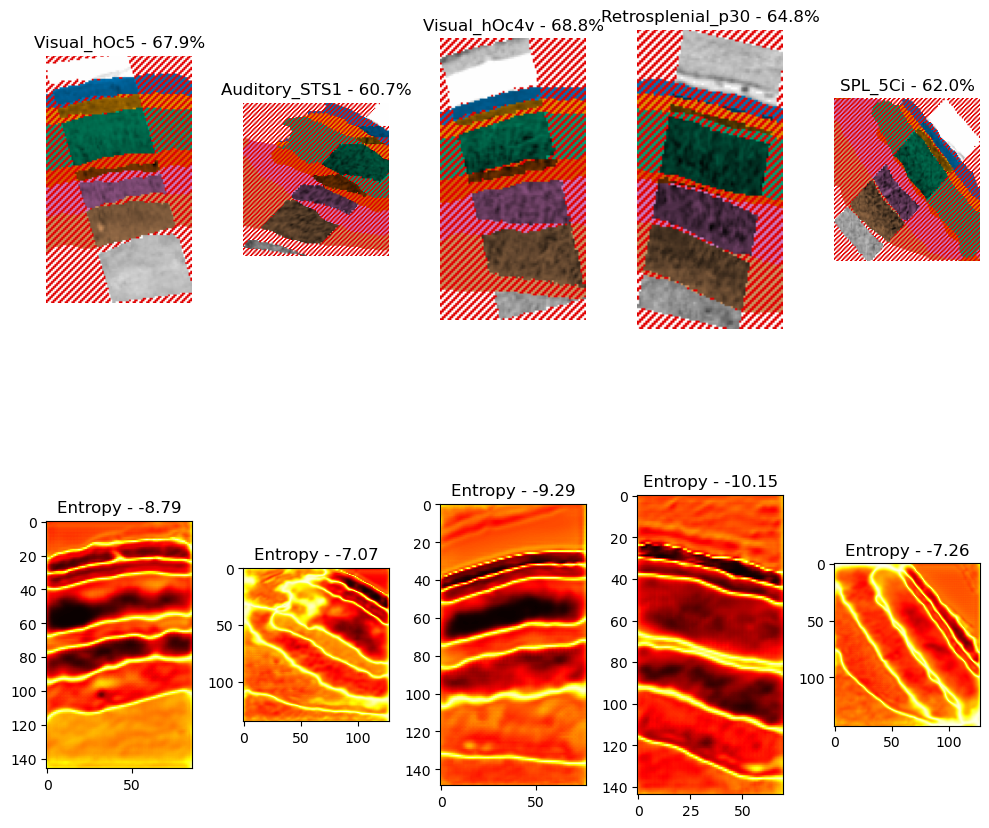

In [56]:
fig, ax = plt.subplots(2,5, figsize=(10, 10))

rand_results_siibra = siibra_results.sample(50)

entropies_siibra = [np.log(evaluate.calculate_entropy(cort.manip.unpad_img(rand_result.prediction.logits, rand_result.ground_truth.segmentation)) + 1e-6) for rand_result in rand_results_siibra]

entropy_max = max([entropy.max() for entropy in entropies_siibra])
entropy_min = min([entropy.min() for entropy in entropies_siibra])

for i, (entropy, rand_result) in enumerate(list(zip(entropies_siibra, rand_results_siibra))[:5]):

    evaluate.display_patch_diff_alt(rand_result.input_image, rand_result.gt_segmentation, rand_result.pred_segmentation, ax=ax[0,i])
    ax[0,i].set_title(f"{rand_result.brain_area} - {rand_result.prediction.accuracy:.1%}")

    ax[1,i].imshow(entropy, cmap="hot", vmin=entropy_min, vmax=entropy_max)
    ax[1,i].set_title(f"Entropy - {entropy.mean():.2f}")

plt.tight_layout()
plt.show()


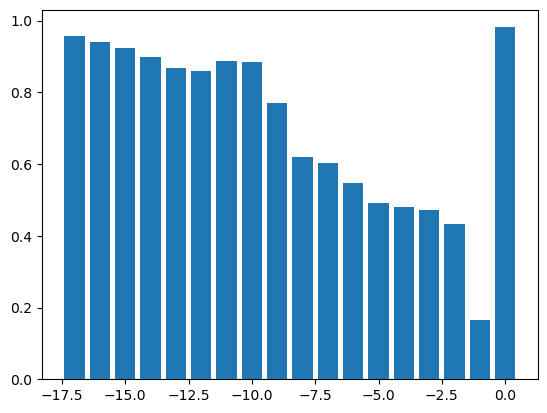

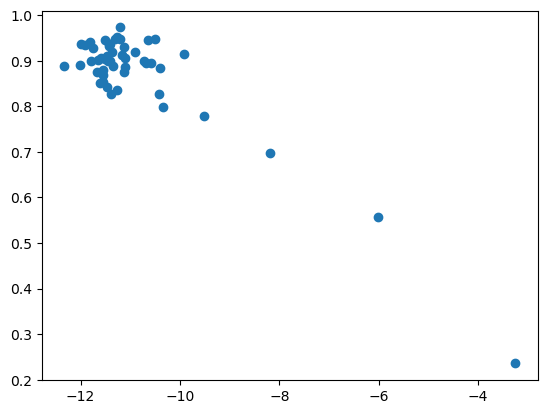

In [57]:
bar_sum = np.zeros(18)
bar_count = np.zeros(18)

patch_level_accuracy = []
avg_patch_entropy = []

for patch, entropy in zip(rand_results, entropies):
    unpadded_pred = cort.manip.unpad_img(patch.prediction.denoised_segmentation, patch.ground_truth.segmentation)
    unpadded_gt = cort.manip.unpad_mask(patch.ground_truth.segmentation)
    accuracy_mask = (unpadded_pred.flatten() == unpadded_gt.flatten()).numpy()

    patch_level_accuracy.append(np.mean(accuracy_mask))
    avg_patch_entropy.append(entropy.mean())

    flat_entropy = entropy.flatten()

    cur_bar_values = []
    for i in range(-17,1):
        entropy_mask = ((flat_entropy > i) & (flat_entropy <= i+1)).numpy()
        bar_count[i+16] += np.sum(entropy_mask)
        bar_sum[i+16] += np.sum(accuracy_mask[entropy_mask])

bar_values = bar_sum / (bar_count + 1e-6)

plt.bar(range(-17,1), bar_values)
plt.show()

plt.scatter(avg_patch_entropy, patch_level_accuracy)
plt.show()


In [13]:
macro_f1 = experiments.calc_macro_f1(all_results)
macro_f1_denoised = experiments.calc_macro_f1(all_results, denoised=True)

print(f"Macro F1 score: {macro_f1:.1%}")
print(f"Denoised macro F1 score: {macro_f1_denoised:.1%}")

Macro F1 score: 86.7%
Denoised macro F1 score: 86.8%


Per-area F1 score:
AIPS_IP1: 95.6% / 95.9%
FrontalPole_Fp2: 95.1% / 95.2%
MFG_Flp1: 95.0% / 94.9%
OFC_Fo1: 94.9% / 94.6%
Auditory_Te10: 94.9% / 94.7%
MFG_Flp2: 94.9% / 93.4%
Cingulum_s32: 94.9% / 94.6%
IPL_PFm: 94.8% / 94.9%
Auditory_TI1: 94.7% / 95.3%
PIPS_hIP6: 94.3% / 94.6%
IPL_PFt: 94.0% / 93.9%
IPL_PGa: 93.9% / 93.1%
Auditory_TI2: 93.8% / 93.6%
Auditory_Te21: 93.7% / 93.4%
Visual_hOc4d: 93.5% / 93.2%
SPL_5L: 93.4% / 92.8%
Broca_45: 93.4% / 93.8%
Visual_hOc4v: 93.2% / 93.6%
IPL_PGp: 93.0% / 92.6%
Auditory_STS2: 93.0% / 92.1%
Operculum_OP2: 92.8% / 92.8%
Auditory_Te11: 92.8% / 92.8%
OFC_Fo5: 92.7% / 93.7%
Auditory_STS1: 92.6% / 92.5%
Insula_Ig2: 92.3% / 92.5%
Operculum_OP9: 92.3% / 93.1%
SPL_7M: 92.3% / 93.3%
Auditory_Te22: 92.3% / 92.5%
OFC_Fo2: 92.1% / 92.9%
Visual_FG2: 91.9% / 92.2%
Cingulum_p32: 91.7% / 91.3%
Visual_hOc2: 91.6% / 92.2%
OFC_Fo3: 91.6% / 91.2%
OFC_Fo7: 91.4% / 91.6%
Visual_FG3: 91.4% / 91.8%
Visual_FG1: 91.3% / 90.9%
IPL_PF: 91.3% / 91.2%
Visual_hOc4lp: 91.2% / 91

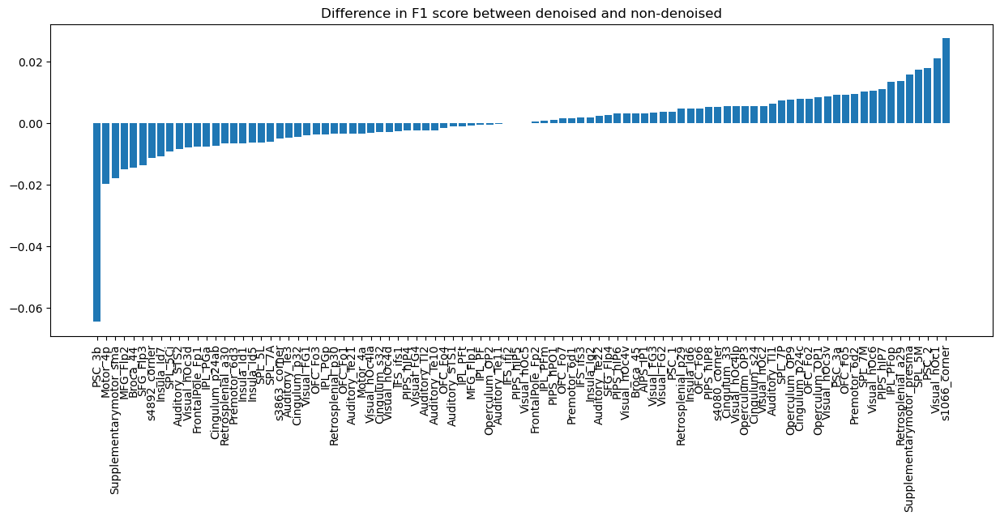

In [14]:
macro_f1_by_area = experiments.calc_f1_by_brain_area(all_results)
macro_f1_by_area_denoised = experiments.calc_f1_by_brain_area(all_results, denoised=True)

print("Per-area F1 score:")
for region, f1 in macro_f1_by_area.items():
    print(f"{region}: {np.mean(f1):.1%} / {np.mean(macro_f1_by_area_denoised[region]):.1%}")

dif_results = [(region, np.mean(macro_f1_by_area_denoised[region])- np.mean(f1)) for region, f1 in macro_f1_by_area.items()]
dif_results.sort(key=lambda x: x[1])

plt.figure(figsize=(15, 5))
plt.bar([region for region, _ in dif_results], [f1_score for _, f1_score in dif_results])
plt.xticks(rotation=90)
plt.title("Difference in F1 score between denoised and non-denoised")
plt.show()

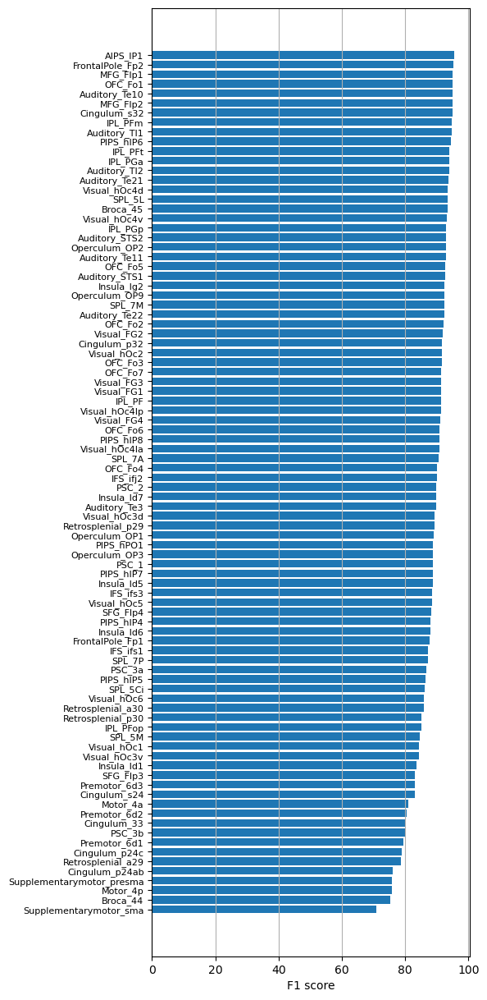

In [15]:
area_results = [(region, np.mean(f1)) for region, f1 in macro_f1_by_area.items() if "corner" not in region]
area_results.sort(key=lambda x: x[1])

plt.figure(figsize=(5, 15))
plt.barh([region for region, _ in area_results], [f1_score*100 for _, f1_score in area_results])
plt.grid(axis="x")
plt.yticks(fontsize=8)
plt.xlabel("F1 score")
plt.show()


In [11]:
f1_by_class = experiments.calc_f1_by_class(all_results)
f1_by_class_denoised = experiments.calc_f1_by_class(all_results, denoised=True)

print("Per-class F1 score:")
for class_name, f1 in f1_by_class.items():
    print(f"{class_name}:\t{np.mean(f1):.1%} / {np.mean(f1_by_class_denoised[class_name]):.1%}")

Per-class F1 score:
BG:	96.8% / 96.4%
I:	94.6% / 94.3%
II:	82.8% / 83.0%
III:	89.9% / 89.9%
IV:	62.4% / 63.4%
V:	83.4% / 83.2%
VI:	85.3% / 85.4%
WM:	87.2% / 87.0%


In [61]:
f1_by_class_by_ba = experiments.calc_f1_by_brain_area_and_class(all_results, denoised=True)

print("Per-class F1 score:")
print(f1_by_class_by_ba)

Per-class F1 score:
     Visual_FG3  Cingulum_p24c  Auditory_Te3  Supplementarymotor_presma  \
BG     0.997454       0.994704      0.989423                   0.994230   
I      0.972667       0.967603      0.947208                   0.964706   
II     0.876812       0.838509      0.890608                   0.872814   
III    0.959091       0.845361      0.911420                   0.965352   
IV     0.786592       0.000000      0.699523                   0.081633   
V      0.908117       0.764563      0.746144                   0.930955   
VI     0.877481       0.795482      0.815577                   0.893361   
WM     0.713568       0.806380      0.852211                   0.925373   

     Cingulum_p32  IFS_ifs1  Visual_hOc3d   OFC_Fo2  8d1_corner  \
BG       0.996724  0.970760      0.989465  0.997833    0.501002   
I        0.975705  0.978897      0.953770  0.956281    0.469397   
II       0.936488  0.786268      0.865185  0.872079    0.352790   
III      0.958843  0.921195      0.9

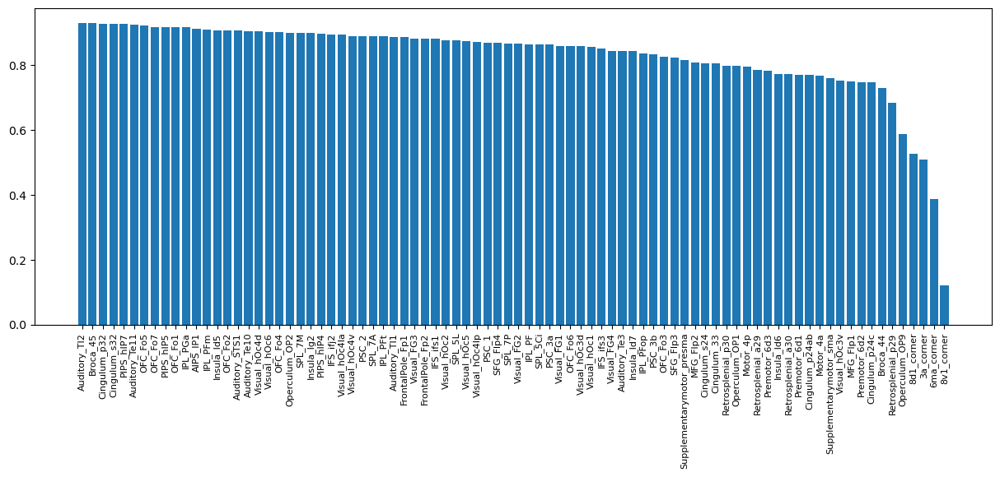

In [62]:
plt.figure(figsize=(15, 5))
plt.bar([region for region in macro_f1_by_area], [f1_score for f1_score in macro_f1_by_area.values()])
plt.xticks(rotation=90, fontsize=8)
plt.show()

In [63]:
evaluate.show_confusion_matrix(all_gts, all_preds, "All regions")

for brain_area, result in results_by_area.items():
    true_masks = np.stack([r.ground_truth_padded for r in result], axis=0)
    pred_masks = np.stack([r.prediction_padded for r in result], axis=0)

    evaluate.show_confusion_matrix(true_masks, pred_masks, brain_area)

NameError: name 'all_gts' is not defined